# **Segmentation of Aerial Images for Drone Landing Detection**

> This project presents a method for drone landing detection using semantic segmentation of aerial images. We train deep learning models, including UNet and PSPNet, on the Semantic Drone Dataset to accurately identify various terrain types. Our fine-tuned UNet achieves the highest performance, effectively identifying safe landing zones while avoiding obstacles.


### Libraries

In [18]:
%pip install albumentations

Note: you may need to restart the kernel to use updated packages.


In [19]:
pip show albumentations

Name: albumentations
Version: 1.4.21
Summary: Fast, flexible, and advanced image augmentation library for deep learning and computer vision. Albumentations offers a wide range of transformations for images, masks, bounding boxes, and keypoints, with optimized performance and seamless integration into ML workflows.
Home-page: https://albumentations.ai
Author: Vladimir Iglovikov
Author-email: 
License: MIT License

Copyright (c) 2017 Vladimir Iglovikov, Alexander Buslaev, Alexander Parinov,

Permission is hereby granted, free of charge, to any person obtaining a copy
of this software and associated documentation files (the "Software"), to deal
in the Software without restriction, including without limitation the rights
to use, copy, modify, merge, publish, distribute, sublicense, and/or sell
copies of the Software, and to permit persons to whom the Software is
furnished to do so, subject to the following conditions:

The above copyright notice and this permission notice shall be included

In [20]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from collections import Counter

import glob
import os

import cv2
import scipy.ndimage as ndi

import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from torchsummary import summary
from torch.utils.data import Dataset, DataLoader
from tqdm import tqdm

import segmentation_models_pytorch as smp
import albumentations as A
from albumentations.pytorch import ToTensorV2

### Data Loading

In [21]:
path = r"C:\Users\nilav\Downloads\dl\new\Segmentation-of-Aerial-Images-main\Segmentation-of-Aerial-Images-main\archive\\"

In [22]:
# Paths
mask_path = path + "RGB_color_image_masks/*.png"
img_path = path + "original_images/*.jpg"

mask_paths = sorted(glob.glob(mask_path))
img_paths = sorted(glob.glob(img_path))


# Classes and palette
class_df = pd.read_csv(path + "class_dict_seg.csv")
class_df['RGB'] = class_df[[' r', ' g', ' b']].values.tolist()

classes = class_df["name"].tolist()
RGBs = class_df["RGB"].tolist()

normalized_palette = np.round(np.array(RGBs, dtype=np.float32) / 255 , 5)
normalized_palette_tuples = [tuple(color) for color in normalized_palette.tolist()]
classes_palette = dict(zip(normalized_palette_tuples, classes))
classes_to_index = {cls: idx for idx, cls in enumerate(classes)}

print("RGB masks set size:", len(mask_paths))
print("Original images set size:", len(img_paths))
print("Number of classes:", len(classes))

RGB masks set size: 400
Original images set size: 400
Number of classes: 24


In [23]:
mask_path

'C:\\Users\\nilav\\Downloads\\dl\\new\\Segmentation-of-Aerial-Images-main\\Segmentation-of-Aerial-Images-main\\archive\\\\RGB_color_image_masks/*.png'

In [24]:
print("Classes:", classes)
print("RGB Values:", RGBs)
print("Normalized Palette:", normalized_palette)
print("Classes Palette Dictionary:", classes_palette)
print("Classes to Index Dictionary:", classes_to_index)

Classes: ['unlabeled', 'paved-area', 'dirt', 'grass', 'gravel', 'water', 'rocks', 'pool', 'vegetation', 'roof', 'wall', 'window', 'door', 'fence', 'fence-pole', 'person', 'dog', 'car', 'bicycle', 'tree', 'bald-tree', 'ar-marker', 'obstacle', 'conflicting']
RGB Values: [[0, 0, 0], [128, 64, 128], [130, 76, 0], [0, 102, 0], [112, 103, 87], [28, 42, 168], [48, 41, 30], [0, 50, 89], [107, 142, 35], [70, 70, 70], [102, 102, 156], [254, 228, 12], [254, 148, 12], [190, 153, 153], [153, 153, 153], [255, 22, 96], [102, 51, 0], [9, 143, 150], [119, 11, 32], [51, 51, 0], [190, 250, 190], [112, 150, 146], [2, 135, 115], [255, 0, 0]]
Normalized Palette: [[0.      0.      0.     ]
 [0.50196 0.25098 0.50196]
 [0.5098  0.29804 0.     ]
 [0.      0.4     0.     ]
 [0.43922 0.40392 0.34118]
 [0.1098  0.16471 0.65882]
 [0.18824 0.16078 0.11765]
 [0.      0.19608 0.34902]
 [0.41961 0.55686 0.13725]
 [0.27451 0.27451 0.27451]
 [0.4     0.4     0.61176]
 [0.99608 0.89412 0.04706]
 [0.99608 0.58039 0.04706]


In [25]:
# Train, val and test split

# Split the data into train and temp (test + validation)
mask_train, mask_temp, img_train, img_temp = train_test_split(mask_paths, img_paths, test_size=0.25, random_state=42)

# Further split the temp data into validation and test
mask_val, mask_test, img_val, img_test = train_test_split(mask_temp, img_temp, test_size=0.5, random_state=42)

# Print the sizes of each split
print(f"Training set size: {len(mask_train)}")
print(f"Validation set size: {len(mask_val)}")
print(f"Test set size: {len(mask_test)}")

Training set size: 300
Validation set size: 50
Test set size: 50


In [ ]:
class_df.he

### Visualizations

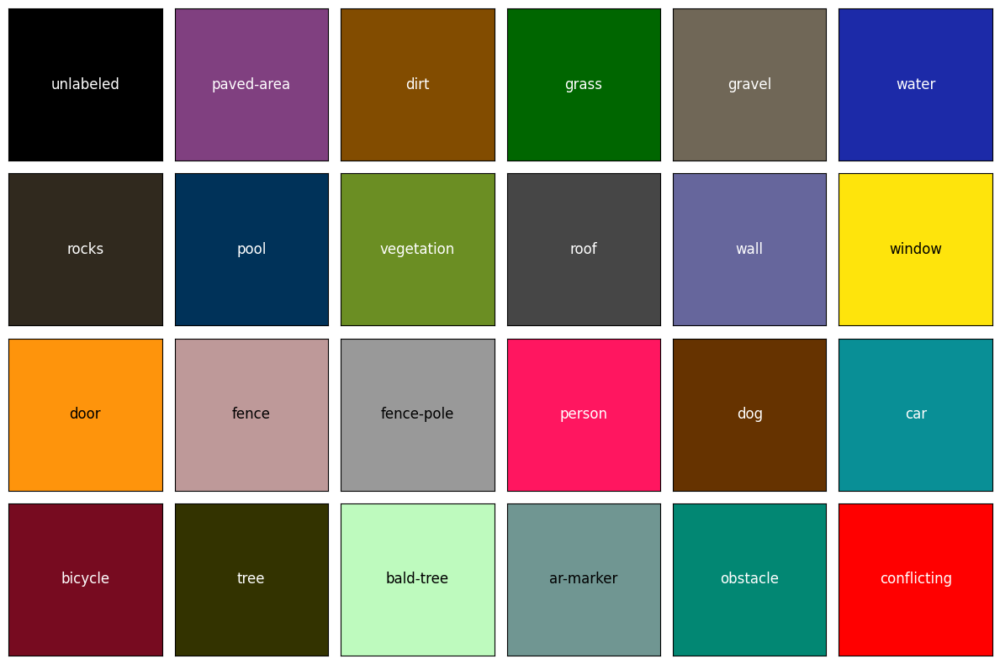

In [26]:
# Palette and classes

fig, axes = plt.subplots(4, 6, figsize=(12, 8))

axes = axes.flatten()
for ax, cls, rgb in zip(axes, classes, normalized_palette):
    ax.set_facecolor(rgb)
    ax.text(0.5, 0.5, cls, ha='center', va='center', fontsize=12, color='white' if sum(rgb) < 1.5 else 'black')
    ax.set_xticks([])
    ax.set_yticks([])

plt.tight_layout()
plt.show()

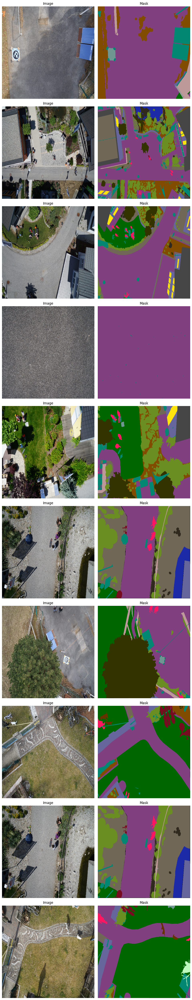

In [27]:
# Sample image

def load_image(path):
    """
    Loads an image or mask, same preprocessing used later for training but higher res vor visualization
    """
    image = cv2.imread(path)
    image = cv2.resize(image, (512,512))
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB).astype(np.float32) / 255.0
    return image

def plot_image_mask_pairs(img_paths, mask_paths, n=1):
    """
    Plots n samples of image-mask pairs.
    """
    fig, axes = plt.subplots(n, 2, figsize=(10, 5 * n))

    for i in range(n):
        idx = np.random.randint(0, len(img_paths))
        img = load_image(img_paths[idx])
        mask = load_image(mask_paths[idx])

        if n == 1:
            axes[0].imshow(img)
            axes[0].set_title('Image')
            axes[1].imshow(mask)
            axes[1].set_title('Mask')
            axes[0].axis('off')
            axes[1].axis('off')
        else:
            axes[i, 0].imshow(img)
            axes[i, 0].set_title('Image')
            axes[i, 1].imshow(mask)
            axes[i, 1].set_title('Mask')
            axes[i, 0].axis('off')
            axes[i, 1].axis('off')

    plt.tight_layout()
    plt.show()
    return mask


mask= plot_image_mask_pairs(img_train, mask_train, n=10)

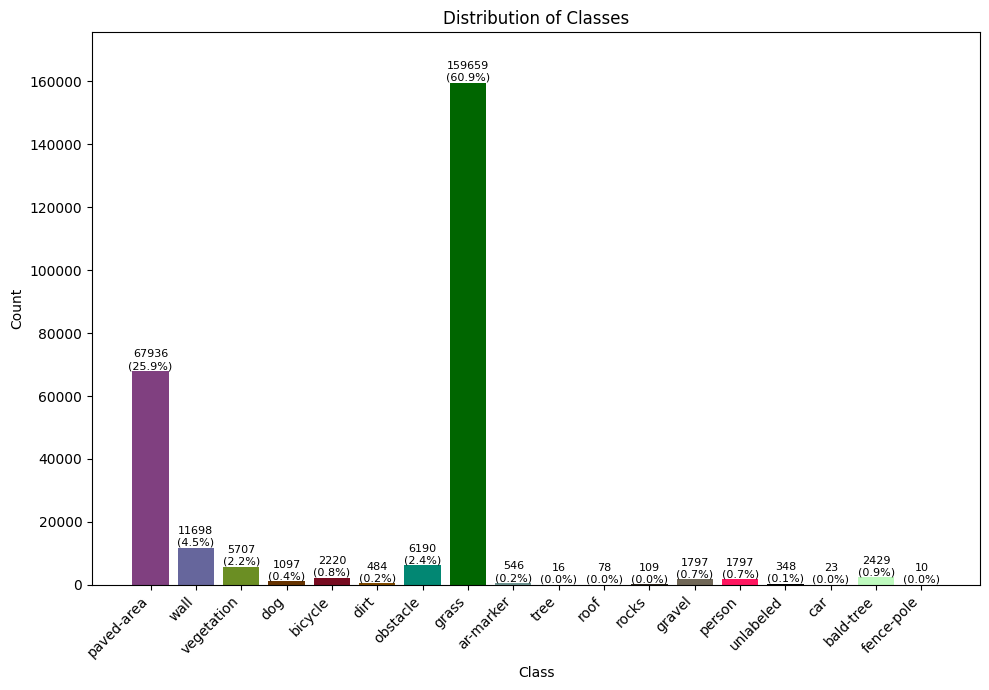

In [ ]:
# Frequency of classes (last sampled image above)

def find_closest_color(pixel, palette):
    '''
    Matches each pixel to the closest in the normalized palette
    '''
    distances = np.linalg.norm(palette - pixel, axis=1)
    return tuple(palette[np.argmin(distances)])


def class_counter(mask, palette, classes_palette):
    """
    Counts the occurrences of each class in the mask annotation
    """
    pixels = [find_closest_color(pixel, palette) for row in mask for pixel in row]
    pixel_counts = Counter(pixels)

    df = pd.DataFrame(list(pixel_counts.items()), columns=['RGB_norm', 'Count'])
    df['Class'] = df['RGB_norm'].map(classes_palette)
    df['Percentage'] = (df['Count'] / df['Count'].sum()) * 100

    return df

def plot_class_distribution(df):
    """
    Plots the distribution of classes
    """
    plt.figure(figsize=(10,7))
    bars = plt.bar(df['Class'], df['Count'], color=[tuple(rgb) for rgb in df['RGB_norm']])

    # Percentages on top of bars
    for bar, count in zip(bars, df['Count']):
        height = bar.get_height()
        plt.text(bar.get_x() + bar.get_width() / 2, height, f'{count}\n({count / df["Count"].sum() * 100:.1f}%)',
                 ha='center', va='bottom', fontsize=8)

    plt.ylim(0, max(df['Count']) + max(df['Count']) * 0.10)
    plt.xlabel('Class')
    plt.ylabel('Count')
    plt.title('Distribution of Classes')
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()

df = class_counter(mask, normalized_palette, classes_palette)
plot_class_distribution(df)

### Data Preparation

In [29]:
# Dataset class creation

class DroneDataset(Dataset):
    def __init__(self, image_paths, mask_paths, transform = None):
        self.image_paths = image_paths
        self.mask_paths = mask_paths
        self.transform = transform

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        '''
        Resizes images and masks to 256x256 for computational efficiency, converts
        to RGB colormap and normalizes into 0-1 range
        '''
        image = cv2.imread(self.image_paths[idx])
        image = cv2.resize(image, (256, 256))
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB).astype(np.float32) / 255.0

        mask = cv2.imread(self.mask_paths[idx])
        mask = cv2.resize(mask, (256, 256))
        mask = cv2.cvtColor(mask, cv2.COLOR_BGR2RGB)

        '''
        Encodes mask RGB values to integer labels 0-9, required for the chosen criterion
        '''
        mask_labels = np.zeros((256, 256), dtype=np.int64)
        for i, color in enumerate(RGBs):
                mask_labels[(mask == color).all(axis=-1)] = i

        if self.transform:
            augmented = self.transform(image=image, mask=mask_labels)
            image = augmented['image']
            mask = augmented['mask']

        return image, mask

> A [list](https://albumentations.ai/docs/getting_started/transforms_and_targets/) of albumentation transforms and their supported targets

In [30]:
# Spatial-level data augmentation (with albumentations)

train_transforms = A.Compose([
    A.HorizontalFlip(p=0.5),
    A.VerticalFlip(p=0.5),
    A.RandomRotate90(p=0.5),
    ToTensorV2()
])

val_transforms = A.Compose([
    ToTensorV2()
])

# Alternative: no augmentation

'''
train_transforms = A.Compose([
    ToTensorV2()
])

val_transforms = A.Compose([
    ToTensorV2()
])
'''

'\ntrain_transforms = A.Compose([\n    ToTensorV2()\n])\n\nval_transforms = A.Compose([\n    ToTensorV2()\n])\n'

In [31]:
# Create the datasets and define DataLoaders

train_dataset = DroneDataset(img_train, mask_train, transform=train_transforms)
val_dataset = DroneDataset(img_val, mask_val, transform=val_transforms)
test_dataset = DroneDataset(img_test, mask_test, transform=val_transforms)

BATCH_SIZE = 16
NUM_WORKERS = 0
train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=NUM_WORKERS)
val_loader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=NUM_WORKERS)
test_loader = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=NUM_WORKERS)


print("Train loader size:", len(train_loader))
print("Validation loader size:", len(val_loader))
print("Test loader size:", len(test_loader))

Train loader size: 19
Validation loader size: 4
Test loader size: 4


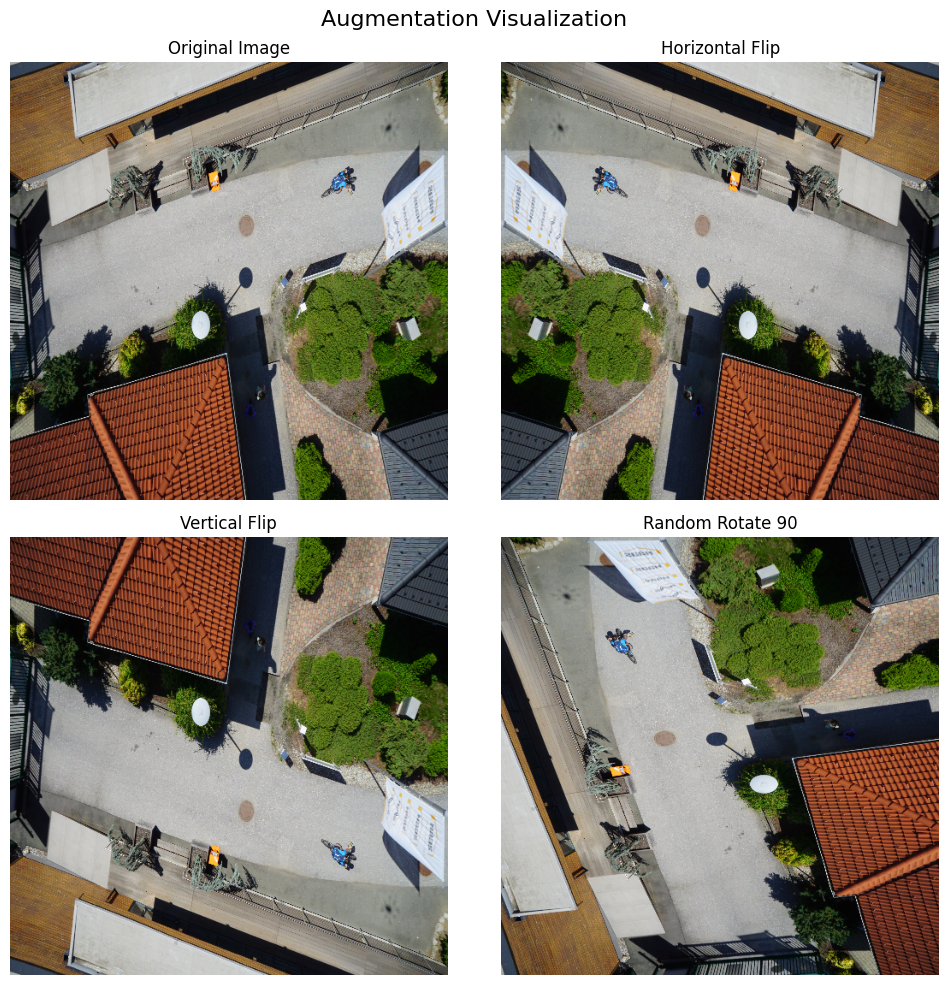

In [32]:
# Visualization

def apply_transform(image, transform):
    '''
    Applies a transformation to an image and returns the transformed image
    '''
    augmented = transform(image=image)
    return augmented['image']

def plot_transformed_images(img_path, transforms):
    '''
    Plots original and augmented images in a grid
    '''
    image = load_image(img_path)

    fig, axes = plt.subplots(2, 2, figsize=(10, 10))
    fig.suptitle('Augmentation Visualization', fontsize=16)

    # Original image
    axes[0, 0].imshow(image)
    axes[0, 0].set_title('Original Image')
    axes[0, 0].axis('off')

    # Apply each transformation and plot
    transform_list = [
        A.HorizontalFlip(p=1),
        A.VerticalFlip(p=1),
        A.RandomRotate90(p=1)] #,
        #A.GaussianBlur(blur_limit=(3, 9), p=1),
        #A.RandomBrightnessContrast(brightness_limit=0.3, contrast_limit=0.3, p=1),
        #A.RandomCrop(height=256, width=256, p=1),
        #A.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.2, p=1),
        #A.GridDistortion(num_steps=10, distort_limit=0.3, p=1)]
    titles = ['Horizontal Flip', 'Vertical Flip',
              'Random Rotate 90' ] #, 'Gaussian Blur', 'Random Brightness/Contrast',
              #'Random Crop','Color Jitter','Grid Distortion']

    for i, (transform, title) in enumerate(zip(transform_list, titles)):
        row = (i + 1) // 2
        col = (i + 1) % 2
        transformed_image = apply_transform(image, transform)
        axes[row, col].imshow(transformed_image)
        axes[row, col].set_title(title)
        axes[row, col].axis('off')

    plt.tight_layout()
    plt.show()

sample_img_path = img_train[np.random.randint(len(img_train))]
plot_transformed_images(sample_img_path, train_transforms)

# Semantic Segmentation

> For the semantic segmentation task, we chose the UNet architecture due to its well-documented effectiveness in pixel-level classification and its versatile application across various fields. We will then explore fine-tuned versions of the classical UNet and PSPNet for comparison. Both of these pre-trained models represent state-of-the-art approaches in semantic segmentation and will be implemented using the Segmentation Models PyTorch library.

_All the trainings were performed on different runs_

### Support Functions

In [33]:
# Training and validation procedures

def train_epoch(model, loader, optimizer, criterion, device):
    model.train()
    train_loss = 0
    correct_pixels = 0
    total_pixels = 0

    for images, masks in tqdm(loader):
        images = images.to(device)
        masks = masks.to(device)
        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, masks)
        loss.backward()
        optimizer.step()
        train_loss += loss.item()

        # Compute predictions
        _, preds = torch.max(outputs, 1)

        # Calculate accuracy
        correct_pixels += (preds == masks).sum().item()
        total_pixels += torch.numel(masks)

    accuracy = correct_pixels / total_pixels
    return train_loss / len(loader), accuracy


def validate_epoch(model, loader, criterion, device):
    model.eval()
    val_loss = 0
    correct_pixels = 0
    total_pixels = 0

    with torch.no_grad():
        for images, masks in tqdm(loader):
            images = images.to(device)
            masks = masks.to(device)
            outputs = model(images)
            loss = criterion(outputs, masks)
            val_loss += loss.item()

            # Compute predictions
            _, preds = torch.max(outputs, 1)

            # Calculate accuracy
            correct_pixels += (preds == masks).sum().item()
            total_pixels += torch.numel(masks)

    accuracy = correct_pixels / total_pixels
    return val_loss / len(loader), accuracy

In [34]:
# Training and validation metrics over epochs

def plot_training_metrics(train_losses, val_losses, train_accuracies, val_accuracies):
    '''
    Simple visualization of the training and validation metrics over epochs
    '''
    epochs = range(1, len(train_losses) + 1)

    train_losses_np = np.array(train_losses)
    val_losses_np = np.array(val_losses)
    train_accuracies_np = np.array(train_accuracies)
    val_accuracies_np = np.array(val_accuracies)

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))

    ax1.plot(epochs, train_losses_np, 'r-', label='Training Loss')
    ax1.plot(epochs, val_losses_np, 'b-', label='Validation Loss')
    ax1.set_title('Training and Validation Loss')
    ax1.set_xlabel('Epochs')
    ax1.set_ylabel('Loss')
    ax1.legend()

    ax2.plot(epochs, train_accuracies_np, 'r-', label='Training Accuracy')
    ax2.plot(epochs, val_accuracies_np, 'b-', label='Validation Accuracy')
    ax2.set_title('Training and Validation Accuracy')
    ax2.set_xlabel('Epochs')
    ax2.set_ylabel('Accuracy')
    ax2.legend()

    plt.tight_layout()
    plt.show()

In [35]:
# Visualization of n examples from the test set

def decode_segmap(mask, colors):
    '''
    Goes back from the 1-9 encoding to the original RGB palette
    '''
    seg_img = np.zeros((mask.shape[0], mask.shape[1], 3), dtype=np.uint8)
    for i, color in enumerate(colors):
        seg_img[mask == i] = color
    return seg_img


def plot_examples(model, loader, device, colors, image_paths, mask_paths, num_examples=4):
    '''
    Plot a specified number of examples from the test set, also including the file names
    '''
    model.eval()
    images, masks, preds, filenames = [], [], [], []
    count = 0
    with torch.no_grad():
        for i, (image, mask) in enumerate(loader):
            image = image.to(device)
            pred = model(image).argmax(dim=1).cpu().numpy()

            for j in range(image.size(0)):
                if count >= num_examples:
                    break
                images.append(image.cpu().numpy()[j].transpose(1, 2, 0))
                masks.append(mask.numpy()[j])
                preds.append(pred[j])
                filenames.append((image_paths[count], mask_paths[count]))
                count += 1

            if count >= num_examples:
                break

    fig, axes = plt.subplots(num_examples, 3, figsize=(15, 5 * num_examples))
    for i in range(num_examples):
        img = images[i]
        mask = masks[i]
        pred = preds[i]
        decoded_mask = decode_segmap(mask, colors)
        decoded_pred = decode_segmap(pred, colors)

        img_filename = os.path.basename(filenames[i][0])
        mask_filename = os.path.basename(filenames[i][1])

        axes[i, 0].imshow(img)
        axes[i, 0].set_title(f"Image: {img_filename}")
        axes[i, 0].axis("off")

        axes[i, 1].imshow(decoded_mask)
        axes[i, 1].set_title(f"Ground Truth Mask: {mask_filename}")
        axes[i, 1].axis("off")

        axes[i, 2].imshow(decoded_pred)
        axes[i, 2].set_title("Predicted Mask")
        axes[i, 2].axis("off")

    plt.show()


In [36]:
# Intersection over Union

def compute_iou(mask1, mask2, num_classes=24):
    '''
    Computes the IoU for each class for a single mask-prediction pair
    '''
    ious = []
    for c in range(num_classes):
        intersection = ((mask1 == c) & (mask2 == c)).sum().item()
        union = ((mask1 == c) | (mask2 == c)).sum().item()
        iou = intersection / union if union != 0 else 0.0
        ious.append(iou)
    return ious

def IoU(model, loader, device, num_classes=24):
    '''
    Computes the IoU for each class for all mask-prediction pairs, then:
    - Computes the class-wise IoUs as the average IoU for each class across all pairs
    - Computes the overall mean IoU as the average of the class-wise IoUs
    '''
    model.eval()
    total_ious = []
    with torch.no_grad():
        for image, mask in loader:
            image = image.to(device)
            pred = model(image).argmax(dim=1).cpu().numpy()
            mask = mask.numpy()

            for m, p in zip(mask, pred):
                ious = compute_iou(m, p, num_classes)
                total_ious.append(ious)

    total_ious = np.array(total_ious)
    # mean_ious_per_class = np.mean(total_ious, axis=0)
    '''
    The following script addresses the issue where computing the mean IoU per class using
    a simple mean would incorrectly average also cases where the classes are absent, treating
    them as zeros and therefore lowering the result.
    '''
    #mean_ious_per_class = np.true_divide(total_ious.sum(axis=0), (total_ious != 0).sum(axis=0))
    # Warning! produces nan for division by 0, solution:
    # Assigns 0 when entire column 0, compute mean (only between non-zeros) otherwise
    #mean_ious_per_class = np.where((total_ious != 0).sum(axis=0) == 0, 1, total_ious.sum(axis=0) / (total_ious != 0).sum(axis=0))
    # (Works but gives the warning still) Alternative:
    class_counts = (total_ious != 0).sum(axis=0)
    class_counts[class_counts == 0] = 1
    mean_ious_per_class = total_ious.sum(axis=0) / class_counts

    overall_mean_iou = np.mean(mean_ious_per_class[mean_ious_per_class != 0])

    return overall_mean_iou, mean_ious_per_class


In [ ]:
# Dice coefficient

def compute_dice(mask1, mask2, num_classes=24):
    '''
    Computes the Dice coefficient for each class for a single mask-prediction pair.
    '''
    dices = []
    for c in range(num_classes):
        intersection = ((mask1 == c) & (mask2 == c)).sum().item()
        size_mask1 = (mask1 == c).sum().item()
        size_mask2 = (mask2 == c).sum().item()
        dice = (2 * intersection) / (size_mask1 + size_mask2) if (size_mask1 + size_mask2) != 0 else 0.0
        dices.append(dice)
    return dices

def Dice(model, loader, device, num_classes=24):
    '''
    Computes the Dice coefficient for each class for all mask-prediction pairs, then:
    - Computes the class-wise Dice coefficients as the average Dice coefficient for each class across all pairs.
    - Computes the overall mean Dice coefficient as the average of the class-wise Dice coefficients.
    '''
    model.eval()
    total_dices = []
    with torch.no_grad():
        for image, mask in loader:
            image = image.to(device)
            pred = model(image).argmax(dim=1).cpu().numpy()
            mask = mask.numpy()

            for m, p in zip(mask, pred):
                dices = compute_dice(m, p, num_classes)
                total_dices.append(dices)

    total_dices = np.array(total_dices)

    class_counts = (total_dices != 0).sum(axis=0)
    class_counts[class_counts == 0] = 1
    mean_dices_per_class = total_dices.sum(axis=0) / class_counts    # same fix

    overall_mean_dice = np.mean(mean_dices_per_class[mean_dices_per_class != 0])

    return overall_mean_dice, mean_dices_per_class


In [38]:
# Pixel accuracy

def compute_accuracy(mask1, mask2, num_classes=24):
    '''
    Computes the accuracy for each class for a single mask-prediction pair
    '''
    accuracies = []
    for c in range(num_classes):
        correct = ((mask1 == c) & (mask2 == c)).sum().item()
        total = (mask1 == c).sum().item()
        accuracy = correct / total if total != 0 else 0.0
        accuracies.append(accuracy)
    return accuracies

def Accuracy(model, loader, device, num_classes=24):
    '''
    Computes the accuracy for each class for all mask-prediction pairs, then:
    - Computes the class-wise accuracies as the average accuracy for each class across all pairs
    - Computes the overall mean accuracy as the average of the class-wise accuracies
    '''
    model.eval()
    total_accuracies = []
    with torch.no_grad():
        for image, mask in loader:
            image = image.to(device)
            pred = model(image).argmax(dim=1).cpu().numpy()
            mask = mask.numpy()

            for m, p in zip(mask, pred):
                accuracies = compute_accuracy(m, p, num_classes)
                total_accuracies.append(accuracies)

    total_accuracies = np.array(total_accuracies)

    class_counts = (total_accuracies != 0).sum(axis=0)
    class_counts[class_counts == 0] = 1
    mean_accuracies_per_class = total_accuracies.sum(axis=0) / class_counts    # same fix

    overall_mean_accuracy = np.mean(mean_accuracies_per_class[mean_accuracies_per_class != 0])

    return overall_mean_accuracy, mean_accuracies_per_class


In [39]:
# Plot the semantic segmentation evaluation metrics

def plot_metrics(iou_per_class, dice_per_class, accuracy_per_class,
                 mean_iou, mean_dice, mean_accuracy, classes, colors):
    '''
    In this version i avoid plotting also the accuracy bars for not making it overwhelming
    '''

    x = np.arange(len(classes))
    width = 0.35

    fig, ax = plt.subplots(figsize=(12, 8), dpi=150)

    bars_iou = ax.bar(x - width/2, iou_per_class, width, color=colors)                  # x - width
    bars_dice = ax.bar(x + width/2, dice_per_class, width, color=colors, alpha = 0.4)   # x
    #bars_acc = ax.bar(x + width, accuracy_per_class, width, color=colors, alpha = 0.3)

    ax.set_ylabel('Scores')
    ax.set_ylim(0, 1)
    #ax.set_title(f'Class-wise IoUs, Dice Scores and Accuracies (Mean IoU: {mean_iou*100:.2f}%, Mean Dice: {mean_dice*100:.2f}%, Mean Accuracy: {mean_accuracy*100:.2f}%)')
    ax.set_title(f'Class-wise IoUs and Dice Coefficients (Mean IoU: {mean_iou*100:.2f}%, Mean Dice: {mean_dice*100:.2f}%)')
    ax.set_xticks(x)
    ax.set_xticklabels(classes, rotation=45, ha='right')

    # Custom legend
    ax.text(0.153, 0.97, 'IoU (left bars)\nDice (right bars)', transform=ax.transAxes, fontsize=12,           #\nAccuracy (right bars)
            verticalalignment='top', horizontalalignment='right', bbox=dict(facecolor='white', alpha=0.6))


    # Attach a text label above each bar in rects, displaying its height in %.
    def autolabel(bars):
        for bar in bars:
            height = bar.get_height()
            ax.annotate(f'{height*100:.2f}%',
                        xy=(bar.get_x() + bar.get_width() / 2, height),
                        xytext=(0, 3),
                        textcoords="offset points",
                        ha='center', va='bottom', fontsize=8)

    autolabel(bars_iou)
    autolabel(bars_dice)
    #autolabel(bars_acc)

    fig.tight_layout()
    plt.show()

## 1. Manually defined Unet

> A UNet is a fully convolutional network whose encoder-decoder structure, coupled with skip connections, allows to capture both low-level and high-level features, which is essential for precise segmentation. The encoder part reduces the spatial dimensions and extracts features, while the decoder part upsamples these features to reconstruct the segmentation map, ensuring detailed and accurate segmentation.

### Model Inizialization

In [40]:
class DoubleConvBlock(nn.Module):
    '''
    This block is used throughout the network to perform convolution operations.
    Each block contains two convolutional layers, each followed by batch
    normalization and a ReLU activation function. This design allows the model
    to learn more complex features.
    '''
    def __init__(self, in_channels, out_channels):
        super(DoubleConvBlock, self).__init__()
        self.conv = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True)
        )

    def forward(self, x):
        return self.conv(x)

class DownsampleBlock(nn.Module):
    '''
    Found in the encoder part, each downsample block consists of a DoubleConvBlock
    followed by a max-pooling layer to reduce spatial dimensions by half, and a
    dropout layer to prevent overfitting. These blocks progressively reduce the
    spatial size of the feature maps while increasing the number of channels.
    '''
    def __init__(self, in_channels, out_channels):
        super(DownsampleBlock, self).__init__()
        self.conv = DoubleConvBlock(in_channels, out_channels)
        self.pool = nn.MaxPool2d(kernel_size=2, stride=2)
        self.dropout = nn.Dropout(0.3)

    def forward(self, x):
        f = self.conv(x)
        p = self.pool(f)
        p = self.dropout(p)
        return f, p

class UpsampleBlock(nn.Module):
    '''
    Located in the decoder part, each up-sample block uses a transposed convolution
    layer to increase the spatial dimensions. It then concatenates the upsampled
    features with corresponding feature maps from the encoder (skip connections)
    before applying a DoubleConvBlock. A dropout layer is also included to reduce overfitting.
    '''
    def __init__(self, in_channels, out_channels):
        super(UpsampleBlock, self).__init__()
        self.up = nn.ConvTranspose2d(in_channels, out_channels, kernel_size=3, stride=2, padding=1, output_padding=1)
        self.conv = DoubleConvBlock(in_channels, out_channels)
        self.dropout = nn.Dropout(0.3)

    def forward(self, x, conv_features):
        x = self.up(x)
        x = torch.cat([x, conv_features], dim=1)
        x = self.dropout(x)
        x = self.conv(x)
        return x

class UNet(nn.Module):
    def __init__(self, n_channels, n_classes):
        super(UNet, self).__init__()
        self.down1 = DownsampleBlock(n_channels, 64)
        self.down2 = DownsampleBlock(64, 128)
        self.down3 = DownsampleBlock(128, 256)
        self.down4 = DownsampleBlock(256, 512)
        self.bottleneck = DoubleConvBlock(512, 1024)               # Lowest level of the U- shaped architecture
        self.up1 = UpsampleBlock(1024, 512)
        self.up2 = UpsampleBlock(512, 256)
        self.up3 = UpsampleBlock(256, 128)
        self.up4 = UpsampleBlock(128, 64)
        self.final_conv = nn.Conv2d(64, n_classes, kernel_size=1)  # The last layer of the network, maps the high-dimensional features to the desired number of classes

    def forward(self, x):
        f1, p1 = self.down1(x)
        f2, p2 = self.down2(p1)
        f3, p3 = self.down3(p2)
        f4, p4 = self.down4(p3)
        bottleneck = self.bottleneck(p4)
        u6 = self.up1(bottleneck, f4)
        u7 = self.up2(u6, f3)
        u8 = self.up3(u7, f2)
        u9 = self.up4(u8, f1)
        outputs = self.final_conv(u9)
        return outputs


model = UNet(n_channels=3, n_classes=24)
total_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
print(f'Total number of parameters: {total_params}')

Total number of parameters: 34526616


In [41]:
optimizer = torch.optim.Adam(model.parameters(), lr=0.0001)
criterion = nn.CrossEntropyLoss()

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Training on {device}")
model.to(device)

Training on cpu


UNet(
  (down1): DownsampleBlock(
    (conv): DoubleConvBlock(
      (conv): Sequential(
        (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (2): ReLU(inplace=True)
        (3): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (4): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (5): ReLU(inplace=True)
      )
    )
    (pool): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (dropout): Dropout(p=0.3, inplace=False)
  )
  (down2): DownsampleBlock(
    (conv): DoubleConvBlock(
      (conv): Sequential(
        (0): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (2): ReLU(inplace=True)
        (3): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), 

### Training

In [42]:
# Training loop

num_epochs = 1
best_val_loss = float('inf')

train_losses = []
val_losses = []
train_accs = []
val_accs = []

for epoch in range(num_epochs):
    train_loss, train_accuracy = train_epoch(model, train_loader, optimizer, criterion, device)
    val_loss, val_accuracy = validate_epoch(model, val_loader, criterion, device)

    print(f"Epoch {epoch+1}/{num_epochs}")
    print(f"Train Loss: {train_loss:.4f}, Train Accuracy: {train_accuracy:.4f}")
    print(f"Val Loss: {val_loss:.4f}, Val Accuracy: {val_accuracy:.4f}")

    # Save the model if validation loss decreases
    if val_loss < best_val_loss:
        best_val_loss = val_loss
        torch.save(model.state_dict(), "best_model.pth")

    train_losses.append(train_loss)
    val_losses.append(val_loss)
    train_accs.append(train_accuracy)
    val_accs.append(val_accuracy)

print("Training completed.")

100%|██████████| 4/4 [02:00<00:00, 30.19s/it]


Epoch 1/1
Train Loss: 2.9835, Train Accuracy: 0.2333
Val Loss: 2.8389, Val Accuracy: 0.4116
Training completed.


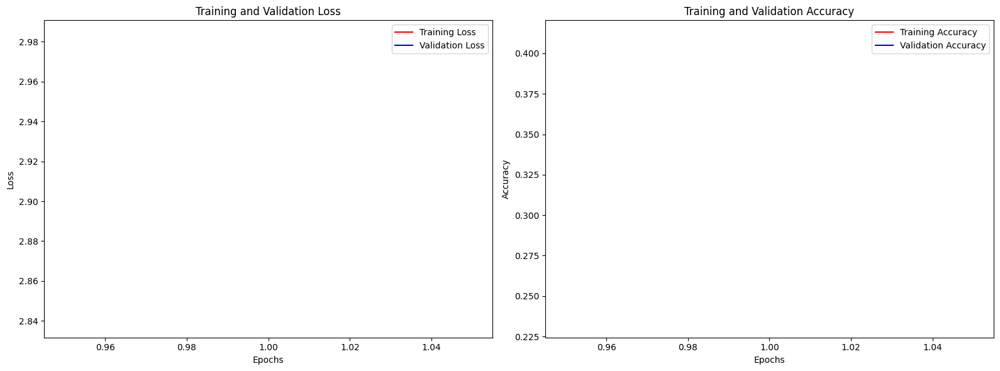

In [43]:
# Training and validation metrics over epochs
plot_training_metrics(train_losses, val_losses, train_accs, val_accs)

### Evaluation

In [44]:
# Load the best model for inference
model.load_state_dict(torch.load("best_model.pth"))
model.eval()

# Evaluate on the test set
test_loss, test_acc = validate_epoch(model, test_loader, criterion, device)
print("")
print(f"Test Loss: {test_loss:.4f}")
print(f"Test Accuracy: {test_acc:.4f}")

C:\Users\nilav\AppData\Local\Temp\ipykernel_26484\3685759085.py:2: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load("best_model.pth"))
100%|███


Test Loss: 2.9844
Test Accuracy: 0.3329


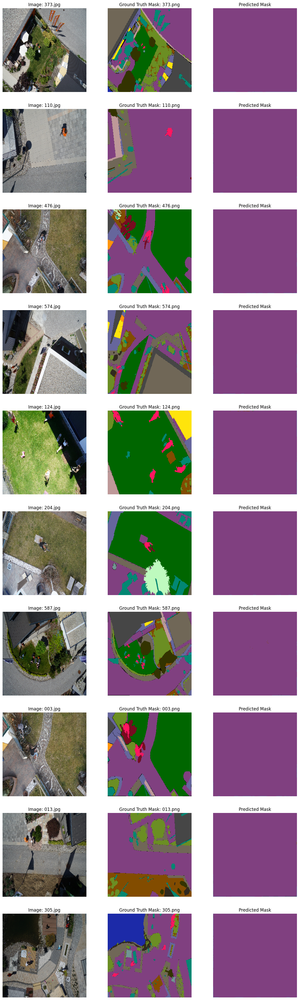

In [45]:
test_image_paths = test_dataset.image_paths
test_mask_paths = test_dataset.mask_paths
plot_examples(model, test_loader, device, RGBs, test_image_paths, test_mask_paths, num_examples=10)

In [46]:
# Semantic Segmentation Evaluation Metrics

mean_iou, iou_per_class = IoU(model, test_loader, device)
mean_dice, dice_per_class = Dice(model, test_loader, device)
mean_accuracy, accuracy_per_class = Accuracy(model, test_loader, device)

print("Overall Mean Accuracy:", mean_accuracy)      # Not included in the plot to not make it overwhelming
print("Accuracy per Class:", accuracy_per_class)

Overall Mean Accuracy: 0.3369439466900406
Accuracy per Class: [0.00000000e+00 9.98737301e-01 5.10464523e-04 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 1.15840746e-02 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00]


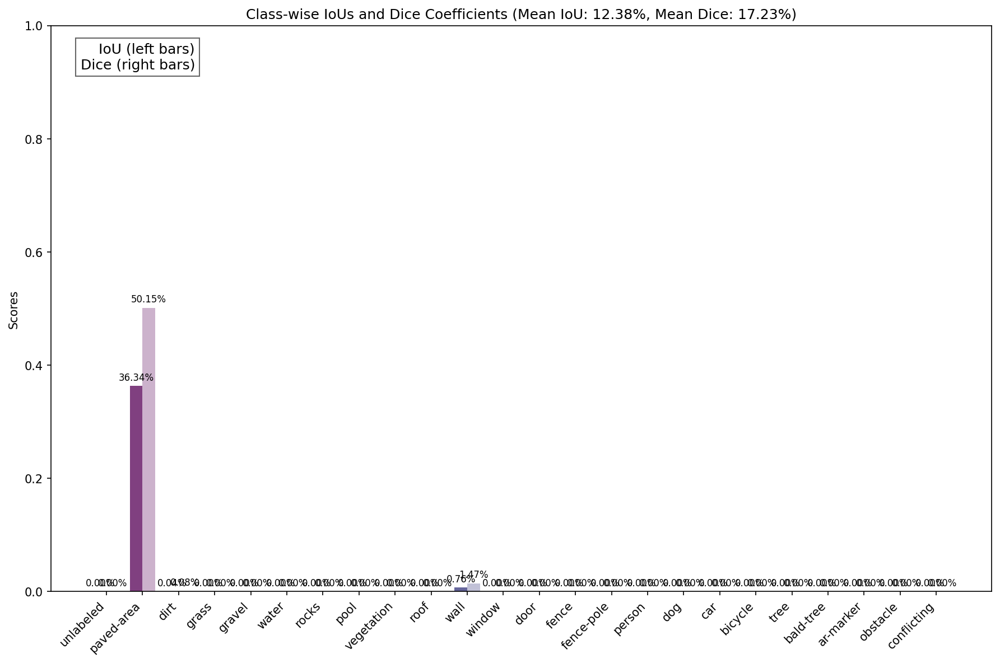

In [47]:
# Plot the semantic segmentation evaluation metrics

plot_metrics(iou_per_class, dice_per_class, accuracy_per_class, mean_iou, mean_dice, mean_accuracy, classes, normalized_palette_tuples)


## 2. Finetuned Unet

> For the fine-tuned UNet, we use a pretrained model with a ResNet-50 backbone, which acts as the encoder, with weights initialized from the ImageNet dataset.

### Model Inizialization

In [48]:
# Load pretrained model and define optimizer and loss function

model = smp.Unet(encoder_name="resnet50",
                 encoder_weights="imagenet",
                 classes=len(classes),
                 activation=None)

# This freezes the encoder part and allows training to work only on the decoder part (just slightly faster)
#for param in model.encoder.parameters():
#    param.requires_grad = False

optimizer = torch.optim.Adam(model.parameters(), lr=0.0001)
criterion = smp.losses.DiceLoss(smp.losses.MULTICLASS_MODE, classes=len(classes))

# Define device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Training on {device}")
model.to(device)

Downloading: "https://download.pytorch.org/models/resnet50-19c8e357.pth" to C:\Users\nilav/.cache\torch\hub\checkpoints\resnet50-19c8e357.pth
100%|██████████| 97.8M/97.8M [01:17<00:00, 1.33MB/s]


Training on cpu


Unet(
  (encoder): ResNetEncoder(
    (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): Sequential(
      (0): Bottleneck(
        (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (downsample): Sequential(
      

### Training

In [49]:
# Training loop

num_epochs = 100
best_val_loss = float('inf')

train_losses = []
val_losses = []
train_accs = []
val_accs = []

for epoch in range(num_epochs):
    train_loss, train_accuracy = train_epoch(model, train_loader, optimizer, criterion, device)
    val_loss, val_accuracy = validate_epoch(model, val_loader, criterion, device)

    print(f"Epoch {epoch+1}/{num_epochs}")
    print(f"Train Loss: {train_loss:.4f}, Train Accuracy: {train_accuracy:.4f}")
    print(f"Val Loss: {val_loss:.4f}, Val Accuracy: {val_accuracy:.4f}")

    # Save the model if validation loss decreases
    if val_loss < best_val_loss:
        best_val_loss = val_loss
        torch.save(model.state_dict(), "best_model.pth")

    train_losses.append(train_loss)
    val_losses.append(val_loss)
    train_accs.append(train_accuracy)
    val_accs.append(val_accuracy)

print("Training completed.")

100%|██████████| 4/4 [00:57<00:00, 14.41s/it]


Epoch 1/100
Train Loss: 0.8884, Train Accuracy: 0.1234
Val Loss: 0.8308, Val Accuracy: 0.2077


100%|██████████| 4/4 [01:04<00:00, 16.07s/it]


Epoch 2/100
Train Loss: 0.8632, Train Accuracy: 0.2901
Val Loss: 0.8102, Val Accuracy: 0.3479


100%|██████████| 4/4 [01:52<00:00, 28.18s/it]


Epoch 3/100
Train Loss: 0.8427, Train Accuracy: 0.4052
Val Loss: 0.7865, Val Accuracy: 0.4431


100%|██████████| 4/4 [01:45<00:00, 26.44s/it]


Epoch 4/100
Train Loss: 0.8311, Train Accuracy: 0.4275
Val Loss: 0.7719, Val Accuracy: 0.4958


100%|██████████| 4/4 [01:48<00:00, 27.09s/it]


Epoch 5/100
Train Loss: 0.8174, Train Accuracy: 0.4515
Val Loss: 0.7662, Val Accuracy: 0.5351


100%|██████████| 4/4 [01:43<00:00, 25.96s/it]


Epoch 6/100
Train Loss: 0.8075, Train Accuracy: 0.4919
Val Loss: 0.7571, Val Accuracy: 0.5332


100%|██████████| 4/4 [01:36<00:00, 24.01s/it]


Epoch 7/100
Train Loss: 0.7909, Train Accuracy: 0.5066
Val Loss: 0.7429, Val Accuracy: 0.5531


100%|██████████| 4/4 [00:49<00:00, 12.35s/it]


Epoch 8/100
Train Loss: 0.7755, Train Accuracy: 0.5347
Val Loss: 0.7355, Val Accuracy: 0.5628


100%|██████████| 4/4 [00:49<00:00, 12.39s/it]


Epoch 9/100
Train Loss: 0.7702, Train Accuracy: 0.5717
Val Loss: 0.7197, Val Accuracy: 0.6290


 11%|█         | 2/19 [01:36<13:43, 48.44s/it]


KeyboardInterrupt: 

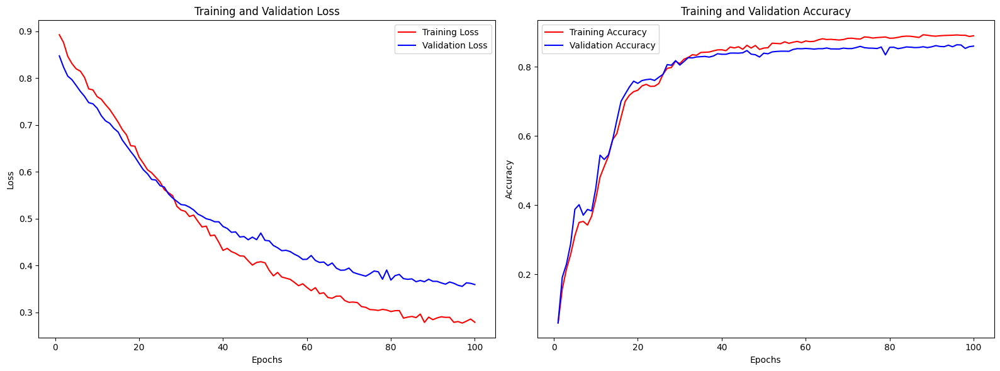

In [ ]:
# Training and validation metrics over epochs

plot_training_metrics(train_losses, val_losses, train_accs, val_accs)

### Evaluation

In [ ]:
# Load the best model for inference
model.load_state_dict(torch.load("best_model.pth"))
model.eval()

# Evaluate on the test set
test_loss, test_acc = validate_epoch(model, test_loader, criterion, device)
print("")
print(f"Test Loss: {test_loss:.4f}")
print(f"Test Accuracy: {test_acc:.4f}")

100%|██████████| 4/4 [00:27<00:00,  6.90s/it]


Test Loss: 0.3275
Test Accuracy: 0.8532


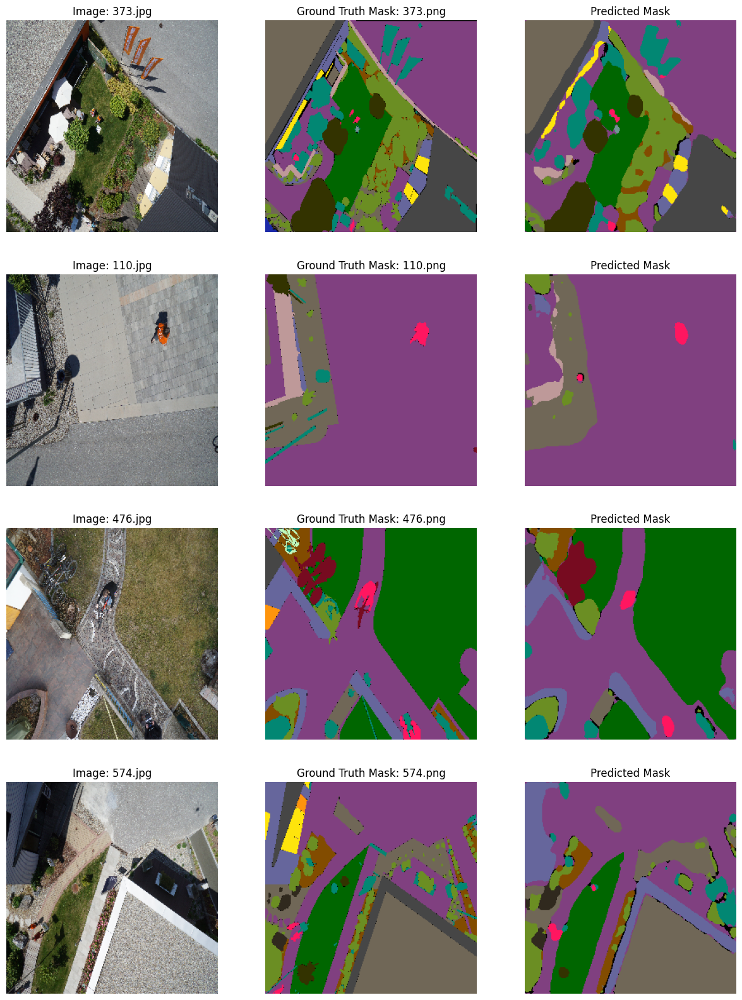

In [ ]:
# Defined above in the first model

test_image_paths = test_dataset.image_paths
test_mask_paths = test_dataset.mask_paths
plot_examples(model, test_loader, device, RGBs, test_image_paths, test_mask_paths)

In [ ]:
# Semantic Segmentation Evaluation Metrics

mean_iou, iou_per_class = IoU(model, test_loader, device)
mean_dice, dice_per_class = Dice(model, test_loader, device)
mean_accuracy, accuracy_per_class = Accuracy(model, test_loader, device)

print("Overall Mean Accuracy:", mean_accuracy)      # Not included in the plot to not make it overwhelming
print("Accuracy per Class:", accuracy_per_class)

Overall Mean Accuracy: 0.6857309585493999
Accuracy per Class: [0.03155982 0.93736678 0.54761425 0.89559908 0.77672008 0.87621354
 0.36979954 0.95600118 0.75541395 0.77628774 0.59930215 0.6289126
 0.         0.52733937 0.         0.61869412 0.69231599 0.95302672
 0.73997148 0.60845355 0.70880939 0.91301937 0.48792942 0.        ]


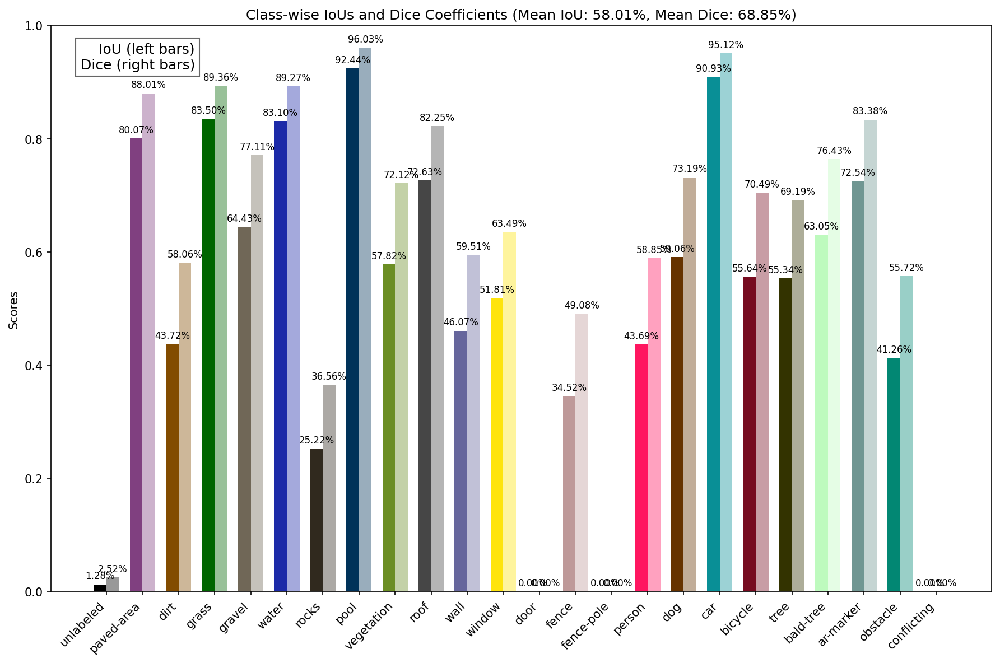

In [ ]:
# Plot the semantic segmentation evaluation metrics

plot_metrics(iou_per_class, dice_per_class, accuracy_per_class, mean_iou, mean_dice, mean_accuracy, classes, normalized_palette_tuples)


## 3. Finetuned PSPNet

> We chose to utilize the Pyramid Scene Parsing Network for our segmentation task due to its ability to effectively capture both local and global context information, which is crucial for accurate scene parsing. The PSPNet has demonstrated state-of-the-art performance on several benchmarks.

### Model Inizialization

In [ ]:
# Load pretrained model and define optimizer and loss function

model = smp.PSPNet(encoder_name="resnet50",
                 encoder_weights="imagenet",
                 classes=len(classes),
                 activation=None)

# This freezes the encoder part and allows training to work only on the decoder part (slightly faster)
#for param in model.encoder.parameters():
#    param.requires_grad = False

optimizer = torch.optim.Adam(model.parameters(), lr=0.0001)
criterion = smp.losses.DiceLoss(smp.losses.MULTICLASS_MODE, classes=len(classes))

# Define device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Training on {device}")
model.to(device)

Training on cuda


PSPNet(
  (encoder): ResNetEncoder(
    (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): Sequential(
      (0): Bottleneck(
        (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (downsample): Sequential(
    

In [ ]:
total_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
print(f'Total number of parameters: {total_params}')

Total number of parameters: 24407000


### Training

In [ ]:
# Training loop

num_epochs = 100
best_val_loss = float('inf')

train_losses = []
val_losses = []
train_accs = []
val_accs = []

for epoch in range(num_epochs):
    train_loss, train_accuracy = train_epoch(model, train_loader, optimizer, criterion, device)
    val_loss, val_accuracy = validate_epoch(model, val_loader, criterion, device)

    print(f"Epoch {epoch+1}/{num_epochs}")
    print(f"Train Loss: {train_loss:.4f}, Train Accuracy: {train_accuracy:.4f}")
    print(f"Val Loss: {val_loss:.4f}, Val Accuracy: {val_accuracy:.4f}")

    # Save the model if validation loss decreases
    if val_loss < best_val_loss:
        best_val_loss = val_loss
        torch.save(model.state_dict(), "best_model.pth")

    train_losses.append(train_loss)
    val_losses.append(val_loss)
    train_accs.append(train_accuracy)
    val_accs.append(val_accuracy)

print("Training completed.")

100%|██████████| 4/4 [00:15<00:00,  3.78s/it]


Epoch 1/100
Train Loss: 0.8558, Train Accuracy: 0.3032
Val Loss: 0.8284, Val Accuracy: 0.5464


100%|██████████| 4/4 [00:14<00:00,  3.54s/it]


Epoch 2/100
Train Loss: 0.7794, Train Accuracy: 0.5685
Val Loss: 0.7589, Val Accuracy: 0.6187


100%|██████████| 4/4 [00:14<00:00,  3.65s/it]


Epoch 3/100
Train Loss: 0.7194, Train Accuracy: 0.5978
Val Loss: 0.7035, Val Accuracy: 0.6341


100%|██████████| 4/4 [00:14<00:00,  3.56s/it]


Epoch 4/100
Train Loss: 0.7005, Train Accuracy: 0.6304
Val Loss: 0.6761, Val Accuracy: 0.6332


100%|██████████| 4/4 [00:14<00:00,  3.53s/it]


Epoch 5/100
Train Loss: 0.6612, Train Accuracy: 0.6534
Val Loss: 0.6581, Val Accuracy: 0.6631


100%|██████████| 4/4 [00:14<00:00,  3.52s/it]


Epoch 6/100
Train Loss: 0.6542, Train Accuracy: 0.6774
Val Loss: 0.6410, Val Accuracy: 0.6636


100%|██████████| 4/4 [00:14<00:00,  3.55s/it]


Epoch 7/100
Train Loss: 0.6149, Train Accuracy: 0.6977
Val Loss: 0.6239, Val Accuracy: 0.6881


100%|██████████| 4/4 [00:14<00:00,  3.53s/it]


Epoch 8/100
Train Loss: 0.5817, Train Accuracy: 0.7153
Val Loss: 0.6136, Val Accuracy: 0.6980


100%|██████████| 4/4 [00:14<00:00,  3.57s/it]


Epoch 9/100
Train Loss: 0.5513, Train Accuracy: 0.7315
Val Loss: 0.5812, Val Accuracy: 0.7191


100%|██████████| 4/4 [00:14<00:00,  3.53s/it]


Epoch 10/100
Train Loss: 0.5590, Train Accuracy: 0.7340
Val Loss: 0.5716, Val Accuracy: 0.7169


100%|██████████| 4/4 [00:14<00:00,  3.62s/it]


Epoch 11/100
Train Loss: 0.5256, Train Accuracy: 0.7435
Val Loss: 0.5623, Val Accuracy: 0.7369


100%|██████████| 4/4 [00:15<00:00,  3.78s/it]


Epoch 12/100
Train Loss: 0.5199, Train Accuracy: 0.7551
Val Loss: 0.5532, Val Accuracy: 0.7401


100%|██████████| 4/4 [00:15<00:00,  3.81s/it]


Epoch 13/100
Train Loss: 0.5085, Train Accuracy: 0.7518
Val Loss: 0.5451, Val Accuracy: 0.7527


100%|██████████| 4/4 [00:14<00:00,  3.69s/it]


Epoch 14/100
Train Loss: 0.4932, Train Accuracy: 0.7632
Val Loss: 0.5447, Val Accuracy: 0.7479


100%|██████████| 4/4 [00:14<00:00,  3.65s/it]


Epoch 15/100
Train Loss: 0.4907, Train Accuracy: 0.7678
Val Loss: 0.5439, Val Accuracy: 0.7498


100%|██████████| 4/4 [00:14<00:00,  3.55s/it]


Epoch 16/100
Train Loss: 0.4911, Train Accuracy: 0.7739
Val Loss: 0.5369, Val Accuracy: 0.7584


100%|██████████| 4/4 [00:14<00:00,  3.50s/it]


Epoch 17/100
Train Loss: 0.4845, Train Accuracy: 0.7797
Val Loss: 0.5390, Val Accuracy: 0.7451


100%|██████████| 4/4 [00:13<00:00,  3.47s/it]


Epoch 18/100
Train Loss: 0.4707, Train Accuracy: 0.7789
Val Loss: 0.5324, Val Accuracy: 0.7580


100%|██████████| 4/4 [00:14<00:00,  3.54s/it]


Epoch 19/100
Train Loss: 0.4710, Train Accuracy: 0.7811
Val Loss: 0.5187, Val Accuracy: 0.7701


100%|██████████| 4/4 [00:14<00:00,  3.58s/it]


Epoch 20/100
Train Loss: 0.4729, Train Accuracy: 0.7854
Val Loss: 0.5124, Val Accuracy: 0.7695


100%|██████████| 4/4 [00:13<00:00,  3.48s/it]


Epoch 21/100
Train Loss: 0.4632, Train Accuracy: 0.7848
Val Loss: 0.5198, Val Accuracy: 0.7509


100%|██████████| 4/4 [00:14<00:00,  3.60s/it]


Epoch 22/100
Train Loss: 0.4597, Train Accuracy: 0.7875
Val Loss: 0.5147, Val Accuracy: 0.7674


100%|██████████| 4/4 [00:14<00:00,  3.55s/it]


Epoch 23/100
Train Loss: 0.4490, Train Accuracy: 0.7919
Val Loss: 0.5049, Val Accuracy: 0.7685


100%|██████████| 4/4 [00:14<00:00,  3.59s/it]


Epoch 24/100
Train Loss: 0.4452, Train Accuracy: 0.7901
Val Loss: 0.4951, Val Accuracy: 0.7773


100%|██████████| 4/4 [00:14<00:00,  3.62s/it]


Epoch 25/100
Train Loss: 0.4417, Train Accuracy: 0.7932
Val Loss: 0.4998, Val Accuracy: 0.7765


100%|██████████| 4/4 [00:14<00:00,  3.58s/it]


Epoch 26/100
Train Loss: 0.4258, Train Accuracy: 0.7964
Val Loss: 0.4940, Val Accuracy: 0.7769


100%|██████████| 4/4 [00:14<00:00,  3.57s/it]


Epoch 27/100
Train Loss: 0.4415, Train Accuracy: 0.7931
Val Loss: 0.4960, Val Accuracy: 0.7801


100%|██████████| 4/4 [00:14<00:00,  3.50s/it]


Epoch 28/100
Train Loss: 0.4300, Train Accuracy: 0.8014
Val Loss: 0.4940, Val Accuracy: 0.7775


100%|██████████| 4/4 [00:14<00:00,  3.60s/it]


Epoch 29/100
Train Loss: 0.4261, Train Accuracy: 0.7989
Val Loss: 0.4884, Val Accuracy: 0.7873


100%|██████████| 4/4 [00:14<00:00,  3.63s/it]


Epoch 30/100
Train Loss: 0.4164, Train Accuracy: 0.8021
Val Loss: 0.4829, Val Accuracy: 0.7804


100%|██████████| 4/4 [00:15<00:00,  3.75s/it]


Epoch 31/100
Train Loss: 0.4229, Train Accuracy: 0.8034
Val Loss: 0.4856, Val Accuracy: 0.7874


100%|██████████| 4/4 [00:14<00:00,  3.55s/it]


Epoch 32/100
Train Loss: 0.4276, Train Accuracy: 0.8022
Val Loss: 0.4849, Val Accuracy: 0.7794


100%|██████████| 4/4 [00:14<00:00,  3.58s/it]


Epoch 33/100
Train Loss: 0.4181, Train Accuracy: 0.8011
Val Loss: 0.4859, Val Accuracy: 0.7844


100%|██████████| 4/4 [00:14<00:00,  3.52s/it]


Epoch 34/100
Train Loss: 0.4061, Train Accuracy: 0.8060
Val Loss: 0.4807, Val Accuracy: 0.7778


100%|██████████| 4/4 [00:14<00:00,  3.54s/it]


Epoch 35/100
Train Loss: 0.4120, Train Accuracy: 0.8073
Val Loss: 0.4711, Val Accuracy: 0.7904


100%|██████████| 4/4 [00:13<00:00,  3.49s/it]


Epoch 36/100
Train Loss: 0.4137, Train Accuracy: 0.8057
Val Loss: 0.4791, Val Accuracy: 0.7751


100%|██████████| 4/4 [00:14<00:00,  3.52s/it]


Epoch 37/100
Train Loss: 0.4056, Train Accuracy: 0.8115
Val Loss: 0.4675, Val Accuracy: 0.7952


100%|██████████| 4/4 [00:14<00:00,  3.63s/it]


Epoch 38/100
Train Loss: 0.4009, Train Accuracy: 0.8103
Val Loss: 0.4822, Val Accuracy: 0.7703


100%|██████████| 4/4 [00:14<00:00,  3.65s/it]


Epoch 39/100
Train Loss: 0.4072, Train Accuracy: 0.8066
Val Loss: 0.4742, Val Accuracy: 0.7932


100%|██████████| 4/4 [00:13<00:00,  3.45s/it]


Epoch 40/100
Train Loss: 0.4010, Train Accuracy: 0.8102
Val Loss: 0.4682, Val Accuracy: 0.7916


100%|██████████| 4/4 [00:14<00:00,  3.68s/it]


Epoch 41/100
Train Loss: 0.3856, Train Accuracy: 0.8136
Val Loss: 0.4764, Val Accuracy: 0.7870


100%|██████████| 4/4 [00:14<00:00,  3.61s/it]


Epoch 42/100
Train Loss: 0.3892, Train Accuracy: 0.8164
Val Loss: 0.4573, Val Accuracy: 0.8001


100%|██████████| 4/4 [00:14<00:00,  3.62s/it]


Epoch 43/100
Train Loss: 0.3941, Train Accuracy: 0.8141
Val Loss: 0.4626, Val Accuracy: 0.7971


100%|██████████| 4/4 [00:14<00:00,  3.62s/it]


Epoch 44/100
Train Loss: 0.3870, Train Accuracy: 0.8122
Val Loss: 0.4592, Val Accuracy: 0.7899


100%|██████████| 4/4 [00:14<00:00,  3.57s/it]


Epoch 45/100
Train Loss: 0.3813, Train Accuracy: 0.8188
Val Loss: 0.4530, Val Accuracy: 0.8019


100%|██████████| 4/4 [00:14<00:00,  3.70s/it]


Epoch 46/100
Train Loss: 0.3846, Train Accuracy: 0.8190
Val Loss: 0.4553, Val Accuracy: 0.7935


100%|██████████| 4/4 [00:14<00:00,  3.56s/it]


Epoch 47/100
Train Loss: 0.3793, Train Accuracy: 0.8168
Val Loss: 0.4577, Val Accuracy: 0.8003


100%|██████████| 4/4 [00:14<00:00,  3.62s/it]


Epoch 48/100
Train Loss: 0.3879, Train Accuracy: 0.8203
Val Loss: 0.4576, Val Accuracy: 0.7981


100%|██████████| 4/4 [00:14<00:00,  3.59s/it]


Epoch 49/100
Train Loss: 0.3807, Train Accuracy: 0.8202
Val Loss: 0.4486, Val Accuracy: 0.8040


100%|██████████| 4/4 [00:14<00:00,  3.54s/it]


Epoch 50/100
Train Loss: 0.3750, Train Accuracy: 0.8182
Val Loss: 0.4502, Val Accuracy: 0.7996


100%|██████████| 4/4 [00:15<00:00,  3.93s/it]


Epoch 51/100
Train Loss: 0.3794, Train Accuracy: 0.8213
Val Loss: 0.4462, Val Accuracy: 0.8036


100%|██████████| 4/4 [00:15<00:00,  3.75s/it]


Epoch 52/100
Train Loss: 0.3895, Train Accuracy: 0.8188
Val Loss: 0.4471, Val Accuracy: 0.8029


100%|██████████| 4/4 [00:14<00:00,  3.65s/it]


Epoch 53/100
Train Loss: 0.3826, Train Accuracy: 0.8187
Val Loss: 0.4558, Val Accuracy: 0.7947


100%|██████████| 4/4 [00:15<00:00,  3.76s/it]


Epoch 54/100
Train Loss: 0.3752, Train Accuracy: 0.8223
Val Loss: 0.4485, Val Accuracy: 0.8039


100%|██████████| 4/4 [00:14<00:00,  3.59s/it]


Epoch 55/100
Train Loss: 0.3764, Train Accuracy: 0.8243
Val Loss: 0.4490, Val Accuracy: 0.7991


100%|██████████| 4/4 [00:14<00:00,  3.62s/it]


Epoch 56/100
Train Loss: 0.3785, Train Accuracy: 0.8232
Val Loss: 0.4404, Val Accuracy: 0.8075


100%|██████████| 4/4 [00:14<00:00,  3.73s/it]


Epoch 57/100
Train Loss: 0.3789, Train Accuracy: 0.8262
Val Loss: 0.4446, Val Accuracy: 0.7983


100%|██████████| 4/4 [00:14<00:00,  3.68s/it]


Epoch 58/100
Train Loss: 0.3725, Train Accuracy: 0.8227
Val Loss: 0.4431, Val Accuracy: 0.8026


100%|██████████| 4/4 [00:15<00:00,  3.76s/it]


Epoch 59/100
Train Loss: 0.3656, Train Accuracy: 0.8277
Val Loss: 0.4427, Val Accuracy: 0.8031


100%|██████████| 4/4 [00:14<00:00,  3.59s/it]


Epoch 60/100
Train Loss: 0.3624, Train Accuracy: 0.8260
Val Loss: 0.4375, Val Accuracy: 0.8066


100%|██████████| 4/4 [00:14<00:00,  3.51s/it]


Epoch 61/100
Train Loss: 0.3882, Train Accuracy: 0.8263
Val Loss: 0.4402, Val Accuracy: 0.8038


100%|██████████| 4/4 [00:14<00:00,  3.61s/it]


Epoch 62/100
Train Loss: 0.3628, Train Accuracy: 0.8295
Val Loss: 0.4389, Val Accuracy: 0.8098


100%|██████████| 4/4 [00:14<00:00,  3.63s/it]


Epoch 63/100
Train Loss: 0.3608, Train Accuracy: 0.8273
Val Loss: 0.4371, Val Accuracy: 0.8091


100%|██████████| 4/4 [00:14<00:00,  3.70s/it]


Epoch 64/100
Train Loss: 0.3643, Train Accuracy: 0.8289
Val Loss: 0.4339, Val Accuracy: 0.8069


100%|██████████| 4/4 [00:14<00:00,  3.65s/it]


Epoch 65/100
Train Loss: 0.3576, Train Accuracy: 0.8289
Val Loss: 0.4384, Val Accuracy: 0.8080


100%|██████████| 4/4 [00:15<00:00,  3.78s/it]


Epoch 66/100
Train Loss: 0.3579, Train Accuracy: 0.8313
Val Loss: 0.4323, Val Accuracy: 0.8098


100%|██████████| 4/4 [00:14<00:00,  3.59s/it]


Epoch 67/100
Train Loss: 0.3685, Train Accuracy: 0.8287
Val Loss: 0.4361, Val Accuracy: 0.8076


100%|██████████| 4/4 [00:14<00:00,  3.67s/it]


Epoch 68/100
Train Loss: 0.3526, Train Accuracy: 0.8304
Val Loss: 0.4419, Val Accuracy: 0.8087


100%|██████████| 4/4 [00:14<00:00,  3.64s/it]


Epoch 69/100
Train Loss: 0.3692, Train Accuracy: 0.8302
Val Loss: 0.4322, Val Accuracy: 0.8074


100%|██████████| 4/4 [00:14<00:00,  3.56s/it]


Epoch 70/100
Train Loss: 0.3582, Train Accuracy: 0.8303
Val Loss: 0.4411, Val Accuracy: 0.8080


100%|██████████| 4/4 [00:14<00:00,  3.54s/it]


Epoch 71/100
Train Loss: 0.3609, Train Accuracy: 0.8301
Val Loss: 0.4364, Val Accuracy: 0.8096


100%|██████████| 4/4 [00:14<00:00,  3.68s/it]


Epoch 72/100
Train Loss: 0.3589, Train Accuracy: 0.8326
Val Loss: 0.4424, Val Accuracy: 0.8046


100%|██████████| 4/4 [00:15<00:00,  3.80s/it]


Epoch 73/100
Train Loss: 0.3555, Train Accuracy: 0.8318
Val Loss: 0.4339, Val Accuracy: 0.8070


100%|██████████| 4/4 [00:14<00:00,  3.71s/it]


Epoch 74/100
Train Loss: 0.3524, Train Accuracy: 0.8333
Val Loss: 0.4350, Val Accuracy: 0.8111


100%|██████████| 4/4 [00:14<00:00,  3.63s/it]


Epoch 75/100
Train Loss: 0.3414, Train Accuracy: 0.8335
Val Loss: 0.4313, Val Accuracy: 0.8146


100%|██████████| 4/4 [00:14<00:00,  3.64s/it]


Epoch 76/100
Train Loss: 0.3448, Train Accuracy: 0.8365
Val Loss: 0.4333, Val Accuracy: 0.8131


100%|██████████| 4/4 [00:14<00:00,  3.68s/it]


Epoch 77/100
Train Loss: 0.3536, Train Accuracy: 0.8333
Val Loss: 0.4269, Val Accuracy: 0.8080


100%|██████████| 4/4 [00:14<00:00,  3.61s/it]


Epoch 78/100
Train Loss: 0.3509, Train Accuracy: 0.8357
Val Loss: 0.4363, Val Accuracy: 0.8087


100%|██████████| 4/4 [00:14<00:00,  3.60s/it]


Epoch 79/100
Train Loss: 0.3497, Train Accuracy: 0.8365
Val Loss: 0.4331, Val Accuracy: 0.8092


100%|██████████| 4/4 [00:14<00:00,  3.55s/it]


Epoch 80/100
Train Loss: 0.3501, Train Accuracy: 0.8346
Val Loss: 0.4300, Val Accuracy: 0.8110


100%|██████████| 4/4 [00:14<00:00,  3.52s/it]


Epoch 81/100
Train Loss: 0.3516, Train Accuracy: 0.8368
Val Loss: 0.4294, Val Accuracy: 0.8086


100%|██████████| 4/4 [00:14<00:00,  3.70s/it]


Epoch 82/100
Train Loss: 0.3463, Train Accuracy: 0.8334
Val Loss: 0.4312, Val Accuracy: 0.8066


100%|██████████| 4/4 [00:14<00:00,  3.62s/it]


Epoch 83/100
Train Loss: 0.3555, Train Accuracy: 0.8377
Val Loss: 0.4272, Val Accuracy: 0.8128


100%|██████████| 4/4 [00:14<00:00,  3.53s/it]


Epoch 84/100
Train Loss: 0.3374, Train Accuracy: 0.8380
Val Loss: 0.4297, Val Accuracy: 0.8136


100%|██████████| 4/4 [00:14<00:00,  3.54s/it]


Epoch 85/100
Train Loss: 0.3445, Train Accuracy: 0.8374
Val Loss: 0.4303, Val Accuracy: 0.8118


100%|██████████| 4/4 [00:14<00:00,  3.59s/it]


Epoch 86/100
Train Loss: 0.3430, Train Accuracy: 0.8393
Val Loss: 0.4298, Val Accuracy: 0.8107


100%|██████████| 4/4 [00:14<00:00,  3.67s/it]


Epoch 87/100
Train Loss: 0.3444, Train Accuracy: 0.8387
Val Loss: 0.4299, Val Accuracy: 0.8137


100%|██████████| 4/4 [00:14<00:00,  3.56s/it]


Epoch 88/100
Train Loss: 0.3388, Train Accuracy: 0.8373
Val Loss: 0.4305, Val Accuracy: 0.8088


100%|██████████| 4/4 [00:14<00:00,  3.62s/it]


Epoch 89/100
Train Loss: 0.3449, Train Accuracy: 0.8402
Val Loss: 0.4337, Val Accuracy: 0.8156


100%|██████████| 4/4 [00:14<00:00,  3.60s/it]


Epoch 90/100
Train Loss: 0.3496, Train Accuracy: 0.8402
Val Loss: 0.4280, Val Accuracy: 0.8107


100%|██████████| 4/4 [00:13<00:00,  3.45s/it]


Epoch 91/100
Train Loss: 0.3395, Train Accuracy: 0.8388
Val Loss: 0.4289, Val Accuracy: 0.8136


100%|██████████| 4/4 [00:14<00:00,  3.54s/it]


Epoch 92/100
Train Loss: 0.3479, Train Accuracy: 0.8395
Val Loss: 0.4347, Val Accuracy: 0.8038


100%|██████████| 4/4 [00:14<00:00,  3.65s/it]


Epoch 93/100
Train Loss: 0.3490, Train Accuracy: 0.8372
Val Loss: 0.4505, Val Accuracy: 0.7973


100%|██████████| 4/4 [00:14<00:00,  3.51s/it]


Epoch 94/100
Train Loss: 0.3404, Train Accuracy: 0.8410
Val Loss: 0.4245, Val Accuracy: 0.8125


100%|██████████| 4/4 [00:14<00:00,  3.52s/it]


Epoch 95/100
Train Loss: 0.3369, Train Accuracy: 0.8421
Val Loss: 0.4283, Val Accuracy: 0.8154


100%|██████████| 4/4 [00:13<00:00,  3.48s/it]


Epoch 96/100
Train Loss: 0.3379, Train Accuracy: 0.8392
Val Loss: 0.4257, Val Accuracy: 0.8133


100%|██████████| 4/4 [00:13<00:00,  3.46s/it]


Epoch 97/100
Train Loss: 0.3296, Train Accuracy: 0.8433
Val Loss: 0.4358, Val Accuracy: 0.8078


100%|██████████| 4/4 [00:13<00:00,  3.45s/it]


Epoch 98/100
Train Loss: 0.3337, Train Accuracy: 0.8413
Val Loss: 0.4261, Val Accuracy: 0.8106


100%|██████████| 4/4 [00:13<00:00,  3.48s/it]


Epoch 99/100
Train Loss: 0.3427, Train Accuracy: 0.8397
Val Loss: 0.4276, Val Accuracy: 0.8074


100%|██████████| 4/4 [00:14<00:00,  3.55s/it]


Epoch 100/100
Train Loss: 0.3374, Train Accuracy: 0.8427
Val Loss: 0.4236, Val Accuracy: 0.8180
Training completed.


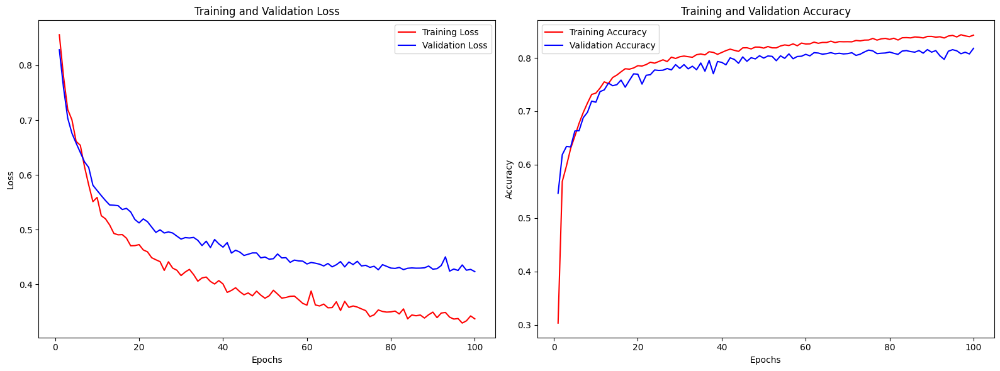

In [ ]:
# Training and validation metrics over epochs

plot_training_metrics(train_losses, val_losses, train_accs, val_accs)

### Evaluation

In [ ]:
# Load the best model for inference
model.load_state_dict(torch.load("best_model.pth"))
model.eval()

# Evaluate on the test set
test_loss, test_acc = validate_epoch(model, test_loader, criterion, device)
print("")
print(f"Test Loss: {test_loss:.4f}")
print(f"Test Accuracy: {test_acc:.4f}")

100%|██████████| 4/4 [00:14<00:00,  3.74s/it]


Test Loss: 0.3774
Test Accuracy: 0.8113


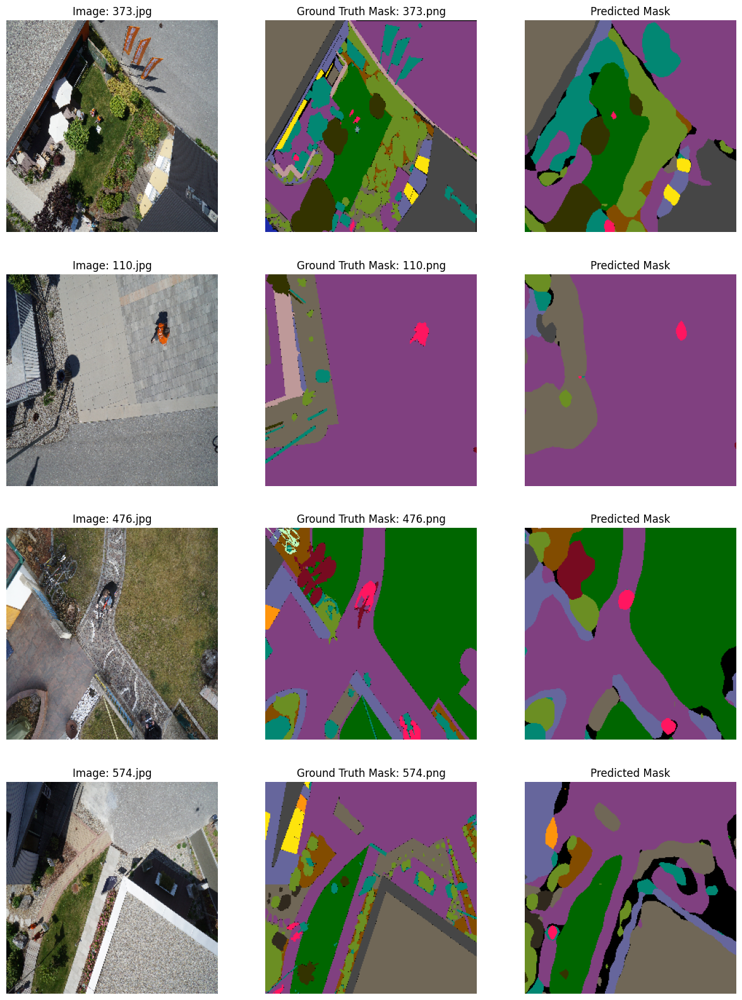

In [ ]:
# Defined above in the first model

test_image_paths = test_dataset.image_paths
test_mask_paths = test_dataset.mask_paths
plot_examples(model, test_loader, device, RGBs, test_image_paths, test_mask_paths)

In [ ]:
# Semantic Segmentation Evaluation Metrics

mean_iou, iou_per_class = IoU(model, test_loader, device)
mean_dice, dice_per_class = Dice(model, test_loader, device)
mean_accuracy, accuracy_per_class = Accuracy(model, test_loader, device)

print("Overall Mean Accuracy:", mean_accuracy)      # Not included in the plot to not make it overwhelming
print("Accuracy per Class:", accuracy_per_class)

Overall Mean Accuracy: 0.5940665902551703
Accuracy per Class: [0.07650986 0.90412757 0.42399604 0.85978567 0.71120376 0.80226576
 0.39375215 0.91691706 0.66984746 0.68787259 0.58441748 0.51820248
 0.         0.49206374 0.38636364 0.54039226 0.48785884 0.73966466
 0.50509618 0.46531801 0.7393676  0.81110678 0.35333539 0.        ]


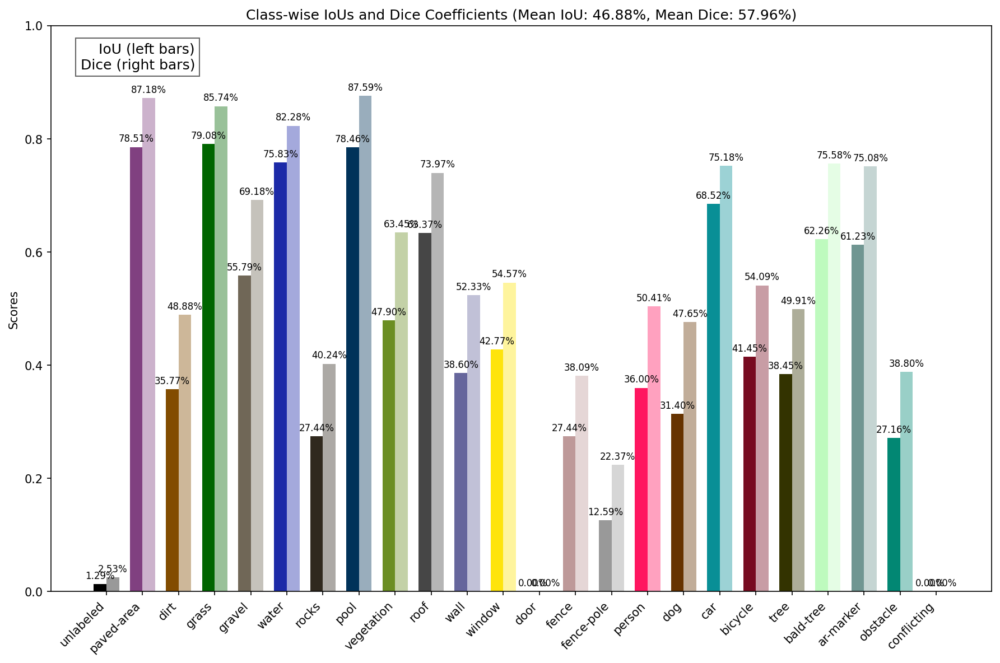

In [ ]:
# Plot the semantic segmentation evaluation metrics

plot_metrics(iou_per_class, dice_per_class, accuracy_per_class, mean_iou, mean_dice, mean_accuracy, classes, normalized_palette_tuples)


# Where do i land?

> In addition to segmentation, another aspect of this project involves developing an algorithm to autonomously identify safe landing spots for drones. This algorithm operates on the automatically segmented images to identify suitable landing zones away from potential obstacles such as buildings and trees. To achieve this, we manually define which of the 24 classes are safe for landing and which must be avoided. Safe classes include areas like paved and grassy areas, while avoid classes include potential obstacles such as roofs, trees, and sensitive classes like people.

In [ ]:
# Load and initialize the chosen model, for example for fine-tuned UNet run:

model = smp.Unet(encoder_name="resnet50",
                 encoder_weights="imagenet",
                 classes=len(classes),
                 activation=None)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Training on {device}")
model.to(device)

# Then load weights

path = "best_model"  

model.load_state_dict(torch.load(path))
model.eval()

Training on cuda


Unet(
  (encoder): ResNetEncoder(
    (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): Sequential(
      (0): Bottleneck(
        (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (downsample): Sequential(
      

### Optimal landing spot algorithm

The best landing spot is found with the following algorithm:

- For each x,y coordinates between the borders (keeping in mind the landing square size).

- If all the points in the landing square whose top left angle is in x,y are safe-to-land points.

- Check the minimum combined distance of that landing square (also the mean has been tried but the min seems to work better).

- If that's the lowest, save the result.

In [ ]:
avoid_classes = [0, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 22, 23]
safe_classes = [1, 2, 3, 4, 21]

def find_best_landing_spot(pred, avoid_classes, safe_classes, landing_square_size=20, border=5):
    avoid_mask = np.isin(pred, avoid_classes)
    safe_mask = np.isin(pred, safe_classes)

    # Distance transform from avoid areas
    distance_transform_avoid = ndi.distance_transform_edt(~avoid_mask)

    # Distance transform from borders
    border_mask = np.zeros_like(pred, dtype=bool)
    border_mask[border:-border, border:-border] = True
    distance_transform_border = ndi.distance_transform_edt(border_mask)

    # Combined distance transform
    combined_distance_transform = np.minimum(distance_transform_avoid, distance_transform_border) # minimum or mean

    best_score = -np.inf
    best_position = None

    for y in range(border, pred.shape[0] - landing_square_size - border + 1):
        for x in range(border, pred.shape[1] - landing_square_size - border + 1):
            if np.all(safe_mask[y:y + landing_square_size, x:x + landing_square_size]):
                combined_distance_score = np.mean(combined_distance_transform[y:y + landing_square_size, x:x + landing_square_size])
                if combined_distance_score > best_score:
                    best_score = combined_distance_score
                    best_position = (x, y)

    return best_position, safe_mask, combined_distance_transform

In [ ]:
def plot_images(images, preds, safe_masks, best_positions, combined_distance_transforms, colors, landing_square_size=20):
    num_images = len(images)
    fig, axes = plt.subplots(num_images, 5, figsize=(25, 5 * num_images))

    for i in range(num_images):
        img = images[i].transpose(1, 2, 0)
        pred = decode_segmap(preds[i], colors)
        safe_mask = safe_masks[i]
        best_position = best_positions[i]
        combined_distance_transform = combined_distance_transforms[i]

        if best_position:
            x, y = best_position
            rect = plt.Rectangle((x, y), landing_square_size, landing_square_size, linewidth=2, edgecolor='r', facecolor='none')

        axes[i, 0].imshow(img)
        axes[i, 0].set_title("Original Image")
        axes[i, 0].axis("off")

        axes[i, 1].imshow(pred)
        axes[i, 1].set_title("Predicted Segmentation Mask")
        axes[i, 1].axis("off")

        axes[i, 2].imshow(safe_mask, cmap='gray')
        axes[i, 2].set_title("Binary Safe Landing Mask")
        axes[i, 2].axis("off")

        im = axes[i, 3].imshow(combined_distance_transform, cmap='RdYlGn', origin='upper')
        #fig.colorbar(im, ax=axes[i, 3], label='Distance to Avoid Zone')
        axes[i, 3].set_title('Safety Heatmap for Landing')
        axes[i, 3].axis("off")

        if best_position:
            axes[i, 4].imshow(img)
            axes[i, 4].add_patch(rect)
            axes[i, 4].set_title("Landing Spot")
            axes[i, 4].axis("off")

    plt.show()


In [ ]:
model.eval()
all_images, all_preds, all_safe_masks, all_best_positions, all_combined_distance_transforms = [], [], [], [], []
with torch.no_grad():
    for image, mask in test_loader:
        image = image.to(device)
        pred = model(image).argmax(dim=1).cpu().numpy()

        for i in range(image.size(0)):
            img_np = image.cpu().numpy()[i]
            pred_np = pred[i]

            best_position, safe_mask, combined_distance_transform = find_best_landing_spot(pred_np, avoid_classes, safe_classes)

            all_images.append(img_np)
            all_preds.append(pred_np)
            all_safe_masks.append(safe_mask)
            all_best_positions.append(best_position)
            all_combined_distance_transforms.append(combined_distance_transform)


plot_images(all_images, all_preds, all_safe_masks, all_best_positions, all_combined_distance_transforms, RGBs)